In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math 

In [2]:
crashes = pd.read_csv('C:/Users/hp/OneDrive/Desktop/LDS24Project/LDS24 - Data/Crashes.csv', skipinitialspace=True) 
people = pd.read_csv('C:/Users/hp/OneDrive/Desktop/LDS24Project/LDS24 - Data/People.csv', skipinitialspace=True) 
vehicles = pd.read_csv('C:/Users/hp/OneDrive/Desktop/LDS24Project/LDS24 - Data/Vehicles.csv', skipinitialspace=True) 

In [3]:
crashes.shape

(257925, 36)

In [4]:
crashes.columns

Index(['RD_NO', 'CRASH_DATE', 'POSTED_SPEED_LIMIT', 'TRAFFIC_CONTROL_DEVICE',
       'DEVICE_CONDITION', 'WEATHER_CONDITION', 'LIGHTING_CONDITION',
       'FIRST_CRASH_TYPE', 'TRAFFICWAY_TYPE', 'ALIGNMENT',
       'ROADWAY_SURFACE_COND', 'ROAD_DEFECT', 'REPORT_TYPE', 'CRASH_TYPE',
       'DATE_POLICE_NOTIFIED', 'PRIM_CONTRIBUTORY_CAUSE',
       'SEC_CONTRIBUTORY_CAUSE', 'STREET_NO', 'STREET_DIRECTION',
       'STREET_NAME', 'BEAT_OF_OCCURRENCE', 'NUM_UNITS', 'MOST_SEVERE_INJURY',
       'INJURIES_TOTAL', 'INJURIES_FATAL', 'INJURIES_INCAPACITATING',
       'INJURIES_NON_INCAPACITATING', 'INJURIES_REPORTED_NOT_EVIDENT',
       'INJURIES_NO_INDICATION', 'INJURIES_UNKNOWN', 'CRASH_HOUR',
       'CRASH_DAY_OF_WEEK', 'CRASH_MONTH', 'LATITUDE', 'LONGITUDE',
       'LOCATION'],
      dtype='object')

In [5]:
crashes[["WEATHER_CONDITION","LIGHTING_CONDITION"]]

,WEATHER_CONDITION,LIGHTING_CONDITION
0,CLEAR,"DARKNESS, LIGHTED ROAD"
1,CLEAR,"DARKNESS, LIGHTED ROAD"
2,CLEAR,DARKNESS
3,CLEAR,DARKNESS
4,CLEAR,"DARKNESS, LIGHTED ROAD"
...,...,...
257920,UNKNOWN,UNKNOWN
257921,CLEAR,DAYLIGHT
257922,RAIN,DAYLIGHT
257923,CLEAR,DAYLIGHT


In [6]:
people.columns

Index(['PERSON_ID', 'PERSON_TYPE', 'RD_NO', 'VEHICLE_ID', 'CRASH_DATE', 'CITY',
       'STATE', 'SEX', 'AGE', 'SAFETY_EQUIPMENT', 'AIRBAG_DEPLOYED',
       'EJECTION', 'INJURY_CLASSIFICATION', 'DRIVER_ACTION', 'DRIVER_VISION',
       'PHYSICAL_CONDITION', 'BAC_RESULT', 'DAMAGE_CATEGORY', 'DAMAGE'],
      dtype='object')

In [8]:
people["CITY"]

0             NaN
1         CHICAGO
2         CHICAGO
3             NaN
4         CHICAGO
           ...   
564560    CHICAGO
564561    CHICAGO
564562    CHICAGO
564563        NaN
564564    CHICAGO
Name: CITY, Length: 564565, dtype: object

In [16]:
people["AGE"]

0          NaN
1         63.0
2         36.0
3          NaN
4         31.0
          ... 
564560    33.0
564561    36.0
564562    41.0
564563     NaN
564564    41.0
Name: AGE, Length: 564565, dtype: float64

In [4]:
vehicles.columns

Index(['CRASH_UNIT_ID', 'RD_NO', 'CRASH_DATE', 'UNIT_NO', 'UNIT_TYPE',
       'VEHICLE_ID', 'MAKE', 'MODEL', 'LIC_PLATE_STATE', 'VEHICLE_YEAR',
       'VEHICLE_DEFECT', 'VEHICLE_TYPE', 'VEHICLE_USE', 'TRAVEL_DIRECTION',
       'MANEUVER', 'OCCUPANT_CNT', 'FIRST_CONTACT_POINT'],
      dtype='object')

In [6]:
vehicles["VEHICLE_DEFECT"]

0         UNKNOWN
1            NONE
2            NONE
3            NONE
4            NONE
           ...   
460432       NONE
460433       NONE
460434       NONE
460435    UNKNOWN
460436       NONE
Name: VEHICLE_DEFECT, Length: 460437, dtype: object

In [5]:
vehicles.isna().sum()

CRASH_UNIT_ID              0
RD_NO                      0
CRASH_DATE                 0
UNIT_NO                    0
UNIT_TYPE                  1
VEHICLE_ID             10373
MAKE                   10373
MODEL                  11786
LIC_PLATE_STATE        49629
VEHICLE_YEAR           88655
VEHICLE_DEFECT         10373
VEHICLE_TYPE           10373
VEHICLE_USE            10373
TRAVEL_DIRECTION       10373
MANEUVER               10373
OCCUPANT_CNT           10373
FIRST_CONTACT_POINT    10388
dtype: int64

In [7]:
crashes.head()

,RD_NO,CRASH_DATE,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,TRAFFICWAY_TYPE,ALIGNMENT,...,INJURIES_NON_INCAPACITATING,INJURIES_REPORTED_NOT_EVIDENT,INJURIES_NO_INDICATION,INJURIES_UNKNOWN,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION
0,JC113649,01/12/2019 12:01:00 AM,30,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,NOT DIVIDED,STRAIGHT AND LEVEL,...,0.0,0.0,1.0,0.0,0,7,1,41.894718,-87.716439,POINT (-87.716439109795 41.894718028422)
1,JC113627,01/11/2019 11:36:00 PM,30,STOP SIGN/FLASHER,FUNCTIONING PROPERLY,CLEAR,"DARKNESS, LIGHTED ROAD",ANGLE,NOT DIVIDED,STRAIGHT AND LEVEL,...,0.0,0.0,2.0,0.0,23,6,1,41.961558,-87.757564,POINT (-87.757564024038 41.961557797444)
2,JC113637,01/11/2019 11:31:00 PM,15,STOP SIGN/FLASHER,FUNCTIONING PROPERLY,CLEAR,DARKNESS,SIDESWIPE OPPOSITE DIRECTION,NOT DIVIDED,STRAIGHT AND LEVEL,...,0.0,0.0,2.0,0.0,23,6,1,41.791460,-87.715908,POINT (-87.715907858157 41.791459913725)
3,JC113630,01/11/2019 11:22:00 PM,35,NO CONTROLS,NO CONTROLS,CLEAR,DARKNESS,PARKED MOTOR VEHICLE,NOT DIVIDED,STRAIGHT AND LEVEL,...,0.0,0.0,1.0,0.0,23,6,1,41.876779,-87.741695,POINT (-87.741694507685 41.876778736117)
4,JC113604,01/11/2019 11:08:00 PM,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,"DARKNESS, LIGHTED ROAD",REAR END,NOT DIVIDED,STRAIGHT AND LEVEL,...,0.0,0.0,3.0,0.0,23,6,1,41.960921,-87.739893,POINT (-87.739893056441 41.960920858153)


In [9]:
crashes.isna().sum()

RD_NO                               0
CRASH_DATE                          0
POSTED_SPEED_LIMIT                  0
TRAFFIC_CONTROL_DEVICE              0
DEVICE_CONDITION                    0
WEATHER_CONDITION                   0
LIGHTING_CONDITION                  0
FIRST_CRASH_TYPE                    0
TRAFFICWAY_TYPE                     0
ALIGNMENT                           0
ROADWAY_SURFACE_COND                0
ROAD_DEFECT                         0
REPORT_TYPE                      4996
CRASH_TYPE                          0
DATE_POLICE_NOTIFIED                0
PRIM_CONTRIBUTORY_CAUSE             0
SEC_CONTRIBUTORY_CAUSE              0
STREET_NO                           0
STREET_DIRECTION                    2
STREET_NAME                         1
BEAT_OF_OCCURRENCE                  4
NUM_UNITS                           0
MOST_SEVERE_INJURY                  7
INJURIES_TOTAL                      0
INJURIES_FATAL                      0
INJURIES_INCAPACITATING             0
INJURIES_NON

In [25]:
df_weather=crashes[["WEATHER_CONDITION","LIGHTING_CONDITION"]]

In [33]:
# Get unique combinations of WEATHER_CONDITION and LIGHTING_CONDITION
unique_combinations = df_weather[['WEATHER_CONDITION', 'LIGHTING_CONDITION']].drop_duplicates().reset_index(drop=True)

unique_combinations

,WEATHER_CONDITION,LIGHTING_CONDITION
0,CLEAR,"DARKNESS, LIGHTED ROAD"
1,CLEAR,DARKNESS
2,CLEAR,DUSK
3,CLOUDY/OVERCAST,DARKNESS
4,UNKNOWN,"DARKNESS, LIGHTED ROAD"
5,UNKNOWN,DARKNESS
6,CLOUDY/OVERCAST,DUSK
7,CLEAR,DAYLIGHT
8,CLEAR,UNKNOWN
9,CLOUDY/OVERCAST,DAYLIGHT


In [ ]:
crashes

In [13]:
people.isna().sum()

PERSON_ID                     0
PERSON_TYPE                   0
RD_NO                         0
VEHICLE_ID                10696
CRASH_DATE                    0
CITY                     143920
STATE                    141976
SEX                        7154
AGE                      160981
SAFETY_EQUIPMENT           1410
AIRBAG_DEPLOYED           10452
EJECTION                   6705
INJURY_CLASSIFICATION       296
DRIVER_ACTION            109766
DRIVER_VISION            109884
PHYSICAL_CONDITION       109501
BAC_RESULT               108833
DAMAGE_CATEGORY               0
DAMAGE                    74309
dtype: int64

In [9]:
people["PERSON_ID"]

0         O561555
1         O561563
2         O561564
3         O561540
4         O561541
           ...   
564560     O30751
564561     O24495
564562     O24496
564563    O481321
564564    P108071
Name: PERSON_ID, Length: 564565, dtype: object

In [17]:
import datetime as dt

In [23]:

from datetime import datetime

date_string = "21 June, 2018"

print("date_string =", date_string)
print("type of date_string =", type(date_string))

date_object = datetime.strptime(date_string, "%d %B, %Y")

2018

In [15]:
people.shape

(564565, 19)

In [47]:
vehicles.shape

(460437, 18)

In [46]:
# Remove rows with duplicate MAKE, MODEL, VEHICLE_YEAR, and VEHICLE_TYPE
df_vehicles_unique = vehicles.drop_duplicates(subset=['MAKE', 'MODEL', 'VEHICLE_YEAR', 'VEHICLE_TYPE'], keep='first').reset_index(drop=True)

df_vehicles_unique.shape

(31618, 18)

In [41]:
import hashlib

def generate_unique_id(vehicle_info: str) -> int:
    # Generate a unique ID based on the hashed vehicle info
    hash_object = hashlib.md5(vehicle_info.encode())  # Encode and hash
    hex_str = hash_object.hexdigest()[:6]             # Get first 6 characters of the hash
    unique_int = int(hex_str, 16)                     # Convert hex to integer
    unique_id = unique_int % 1000000                  # Limit to a range (0 - 999999)
    return unique_id

# Apply the function to each row in the DataFrame, generating unique IDs
vehicles['unique_id'] = vehicles.apply(
    lambda row: generate_unique_id(f"{row['MAKE']}{row['MODEL']}{row['VEHICLE_YEAR']}{row['VEHICLE_TYPE']}"), axis=1
)

# unique_id_vehicle now contains the generated unique IDs
unq_id_vehicle = vehicles['unique_id'].tolist()


In [42]:
unq_id_vehicle

[259855,
 835438,
 116718,
 274943,
 3574,
 141440,
 527443,
 544970,
 265227,
 740899,
 255450,
 358811,
 259855,
 335031,
 259855,
 259855,
 369426,
 844400,
 415617,
 107179,
 13404,
 199173,
 609527,
 358530,
 684030,
 301753,
 795395,
 757696,
 728323,
 854814,
 982814,
 397020,
 495884,
 476854,
 719160,
 576921,
 977410,
 167991,
 101463,
 908922,
 412467,
 252927,
 149795,
 991247,
 716274,
 223288,
 862590,
 450741,
 445516,
 69848,
 966938,
 167585,
 363016,
 385475,
 747645,
 260427,
 240444,
 983576,
 82018,
 262919,
 966596,
 529716,
 259855,
 129689,
 235007,
 703219,
 556104,
 181925,
 142205,
 249644,
 276067,
 57551,
 800023,
 760122,
 45232,
 914901,
 201341,
 310737,
 307020,
 983432,
 636899,
 266021,
 958993,
 777380,
 875076,
 419071,
 156881,
 240444,
 936508,
 205231,
 626476,
 674057,
 306266,
 772998,
 196372,
 451248,
 621797,
 772491,
 515952,
 270821,
 240444,
 140075,
 938720,
 529780,
 936519,
 719160,
 674036,
 259855,
 479695,
 259855,
 901492,
 177924,

In [43]:
from collections import Counter

# Count occurrences of each unique ID
id_counts = Counter(unq_id_vehicle)

# Find duplicates: IDs with a count greater than 1
duplicates = [item for item, count in id_counts.items() if count > 1]

# Output duplicates (if any)
print("Duplicates found:", duplicates)

Duplicates found: [259855, 835438, 116718, 274943, 3574, 141440, 527443, 544970, 265227, 740899, 255450, 358811, 335031, 369426, 844400, 415617, 107179, 13404, 199173, 358530, 684030, 301753, 795395, 757696, 728323, 854814, 982814, 397020, 495884, 476854, 719160, 576921, 977410, 167991, 101463, 908922, 412467, 252927, 149795, 716274, 223288, 862590, 450741, 445516, 69848, 966938, 167585, 363016, 385475, 747645, 260427, 240444, 983576, 82018, 262919, 966596, 529716, 129689, 235007, 703219, 556104, 181925, 142205, 249644, 276067, 57551, 800023, 760122, 45232, 914901, 201341, 310737, 307020, 983432, 636899, 266021, 958993, 777380, 875076, 419071, 156881, 936508, 205231, 626476, 674057, 306266, 772998, 196372, 451248, 621797, 772491, 515952, 270821, 140075, 938720, 529780, 936519, 674036, 479695, 901492, 177924, 330264, 328337, 657006, 160891, 212773, 310295, 461673, 798405, 879594, 721858, 547203, 223617, 617012, 971073, 672230, 468667, 310777, 149189, 672096, 841383, 82220, 600521, 92730

In [15]:
import hashlib

In [22]:
vehicles.columns

Index(['CRASH_UNIT_ID', 'RD_NO', 'CRASH_DATE', 'UNIT_NO', 'UNIT_TYPE',
       'VEHICLE_ID', 'MAKE', 'MODEL', 'LIC_PLATE_STATE', 'VEHICLE_YEAR',
       'VEHICLE_DEFECT', 'VEHICLE_TYPE', 'VEHICLE_USE', 'TRAVEL_DIRECTION',
       'MANEUVER', 'OCCUPANT_CNT', 'FIRST_CONTACT_POINT'],
      dtype='object')

In [1]:
def generate_unique_id(vehicle_info: str) -> str:
    hash_object = hashlib.md5(str(vehicle_info)).encode()
    hex_str = hash_object.hexdigest()[:6]  # Get first 6 characters of the hash
    unique_int = int(hex_str, 16)           # Convert hex to integer
    unique_id = unique_int % 1000000        # Limit to a range (0 - 999999)
     
    return unique_id

# Apply the function to each row in the DataFrame, generating unique IDs
vehicles['unique_id'] = vehicles.apply(
    lambda row: generate_unique_id(f"{row['MAKE']}{row['MODEL']}{row['VEHICLE_YEAR']}{row['VEHICLE_TYPE']}"), axis=1
)

# unique_id_vehicle now contains the generated unique IDs
unq_id_vehicle = vehicles['unique_id'].tolist()


In [36]:
unq_id_vehicle

[-107125515690117560,
 -6562544247804732405,
 -7764922819801033879,
 2470518921846159355,
 4553020705255600101,
 4078204231273837295,
 -2713384836332134880,
 8619898150266272420,
 8575578863765344471,
 -3826428472549250308,
 4063725184979790842,
 -8341568941531130569,
 -107125515690117560,
 -5955724907286326018,
 -107125515690117560,
 -107125515690117560,
 -4764269260577589596,
 -5808027400362818507,
 7623822721069574407,
 -3694851768873615397,
 2244168015386932009,
 7314797050383779898,
 -792577103536833029,
 4922469730571467817,
 -8327510608877957093,
 1466837510424743806,
 5489923922247919216,
 560749017559584718,
 -5267772599131295495,
 -4963737522697180930,
 -7100598176512225976,
 6744887497218778373,
 -1425708234834367699,
 3238202522433915194,
 7346928598983472106,
 6370201595810645233,
 -6247253755528229308,
 147174207873340254,
 8730111413365532364,
 7061770171500532397,
 4179436895233411703,
 -5203980643538797143,
 -109889352018157553,
 -2811150476188241762,
 1996656888868659

In [16]:
generate_unique_id("TOYOTA MOTOR COMPANY, LTD."+"Highlander(beginning vehicle year 2001)"+ "2019"+"SPORT UTILITY VEHICLE (SUV)")

752956.0

In [ ]:
generate_unique_id()

In [4]:
# Check for missing values in each column
missing_values = crashes.isnull().sum()
print(missing_values)

RD_NO                               0
CRASH_DATE                          0
POSTED_SPEED_LIMIT                  0
TRAFFIC_CONTROL_DEVICE              0
DEVICE_CONDITION                    0
WEATHER_CONDITION                   0
LIGHTING_CONDITION                  0
FIRST_CRASH_TYPE                    0
TRAFFICWAY_TYPE                     0
ALIGNMENT                           0
ROADWAY_SURFACE_COND                0
ROAD_DEFECT                         0
REPORT_TYPE                      4996
CRASH_TYPE                          0
DATE_POLICE_NOTIFIED                0
PRIM_CONTRIBUTORY_CAUSE             0
SEC_CONTRIBUTORY_CAUSE              0
STREET_NO                           0
STREET_DIRECTION                    2
STREET_NAME                         1
BEAT_OF_OCCURRENCE                  4
NUM_UNITS                           0
MOST_SEVERE_INJURY                  7
INJURIES_TOTAL                      0
INJURIES_FATAL                      0
INJURIES_INCAPACITATING             0
INJURIES_NON

In [6]:
# Check for missing values in each column
missing_values = people.isnull().sum()
print(missing_values)

PERSON_ID                     0
PERSON_TYPE                   0
RD_NO                         0
VEHICLE_ID                10696
CRASH_DATE                    0
CITY                     143920
STATE                    141976
SEX                        7154
AGE                      160981
SAFETY_EQUIPMENT           1410
AIRBAG_DEPLOYED           10452
EJECTION                   6705
INJURY_CLASSIFICATION       296
DRIVER_ACTION            109766
DRIVER_VISION            109884
PHYSICAL_CONDITION       109501
BAC_RESULT               108833
DAMAGE_CATEGORY               0
DAMAGE                    74309
dtype: int64


In [ ]:
import hashlib
import csv
import random

# Step 1: Read the dataset from a CSV file
filename = 'C:/Users/hp/OneDrive/Desktop/LDS24Project/LDS24 - Data/People.csv'
people = []

with open(filename, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        # Convert VEHICLE_ID to float if it's not empty, else None
        row['VEHICLE_ID'] = float(row['VEHICLE_ID']) if row['VEHICLE_ID'] else None
        people.append(row)

# Step 2: Identify missing VEHICLE_IDs and generate unique values
existing_vehicle_ids = {row['VEHICLE_ID'] for row in people if row['VEHICLE_ID'] is not None}

def generate_unique_id(index):
    # Generate a unique ID by hashing the index
    while True:
        # Generate a base unique ID by hashing the index
        hash_object = hashlib.md5(str(index).encode())
        hex_str = hash_object.hexdigest()[:6]  # Get first 6 characters of the hash
        unique_int = int(hex_str, 16)           # Convert hex to integer
        unique_id = unique_int % 1000000        # Limit to a range (0 - 999999)
        
        # Format as a float
        unique_id_float = float(unique_id)
        
        # Ensure uniqueness by checking against existing IDs
        if unique_id_float not in existing_vehicle_ids:
            existing_vehicle_ids.add(unique_id_float)
            return unique_id_float
        
        # If duplicate, we may want to add a random number to create uniqueness
        unique_id += random.randint(1, 10000)  # Add a random number to help ensure uniqueness

for i, row in enumerate(people):
    if row['VEHICLE_ID'] is None:
        # Step 3: Fill missing VEHICLE_ID with a unique ID
        row['VEHICLE_ID'] = generate_unique_id(i)

# Step 4: Save the updated data back to a new CSV file
output_filename = 'updatedddd_people.csv'
with open(output_filename, mode='w', newline='') as file:
    fieldnames = people[0].keys()  # Use the fieldnames from the first row
    writer = csv.DictWriter(file, fieldnames=fieldnames)
    writer.writeheader()
    writer.writerows(people)

print("Missing VEHICLE_IDs filled and saved to 'updatedddd_people.csv'")

# Step 5: Check for duplicates in the updated CSV file
duplicate_check_filename = output_filename

# Read the updated CSV file
vehicle_ids = []

with open(duplicate_check_filename, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        vehicle_ids.append(row['VEHICLE_ID'])

# Check for duplicates
vehicle_id_count = {}
duplicates = []

for vehicle_id in vehicle_ids:
    if vehicle_id in vehicle_id_count:
        vehicle_id_count[vehicle_id] += 1
    else:
        vehicle_id_count[vehicle_id] = 1

# Identify duplicates
for vehicle_id, count in vehicle_id_count.items():
    if count > 1:
        duplicates.append((vehicle_id, count))

# Output the result
if duplicates:
    print("Duplicate VEHICLE_IDs found:")
    for vehicle_id, count in duplicates:
        print(f"VEHICLE_ID: {vehicle_id}, Count: {count}")
else:
    print("No duplicate VEHICLE_IDs found.")


In [20]:
import hashlib
import csv

# Step 1: Read the dataset from a CSV file
filename = 'C:/Users/hp/OneDrive/Desktop/LDS24Project/LDS24 - Data/People.csv'
people = []

with open(filename, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        # Convert VEHICLE_ID to float if it's not empty, else None
        row['VEHICLE_ID'] = float(row['VEHICLE_ID']) if row['VEHICLE_ID'] else None
        people.append(row)

# Step 2: Identify missing VEHICLE_IDs and generate unique values
def generate_unique_id(index):
    # Generate a unique ID by hashing the index
    hash_object = hashlib.md5(str(index).encode())
    hex_str = hash_object.hexdigest()[:6]  # Get first 6 characters of the hash
    unique_int = int(hex_str, 16)           # Convert hex to integer
    unique_id = unique_int % 1000000        # Limit to a range (0 - 999999)
    
    # Format as a float with one decimal place
    return float(unique_id)

for i, row in enumerate(people):
    if row['VEHICLE_ID'] is None:
        # Step 3: Fill missing VEHICLE_ID with a unique ID
        row['VEHICLE_ID'] = generate_unique_id(i)

# Step 4: Save the updated data back to a new CSV file
output_filename = 'updateddd_people.csv'
with open(output_filename, mode='w', newline='') as file:
    fieldnames = people[0].keys()  # Use the fieldnames from the first row
    writer = csv.DictWriter(file, fieldnames=fieldnames)
    writer.writeheader()
    writer.writerows(people)

print("Missing VEHICLE_IDs filled and saved to 'updateddd_people.csv'")


# Step 5: Check for duplicates in the updated CSV file
duplicate_check_filename = output_filename

# Read the updated CSV file
vehicle_ids = []

with open(duplicate_check_filename, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        vehicle_ids.append(row['VEHICLE_ID'])

# Check for duplicates
vehicle_id_count = {}
duplicates = []

for vehicle_id in vehicle_ids:
    if vehicle_id in vehicle_id_count:
        vehicle_id_count[vehicle_id] += 1
    else:
        vehicle_id_count[vehicle_id] = 1

# Identify duplicates
for vehicle_id, count in vehicle_id_count.items():
    if count > 1:
        duplicates.append((vehicle_id, count))

# Output the result
if duplicates:
    print("Duplicate VEHICLE_IDs found:")
    for vehicle_id, count in duplicates:
        print(f"VEHICLE_ID: {vehicle_id}, Count: {count}")
else:
    print("No duplicate VEHICLE_IDs found.")


Missing VEHICLE_IDs filled and saved to 'updateddd_people.csv'
Duplicate VEHICLE_IDs found:
VEHICLE_ID: 535703.0, Count: 2
VEHICLE_ID: 535691.0, Count: 2
VEHICLE_ID: 535694.0, Count: 2
VEHICLE_ID: 535725.0, Count: 2
VEHICLE_ID: 535678.0, Count: 2
VEHICLE_ID: 535688.0, Count: 2
VEHICLE_ID: 535659.0, Count: 2
VEHICLE_ID: 535671.0, Count: 3
VEHICLE_ID: 535647.0, Count: 2
VEHICLE_ID: 535615.0, Count: 2
VEHICLE_ID: 535560.0, Count: 2
VEHICLE_ID: 535632.0, Count: 3
VEHICLE_ID: 535575.0, Count: 3
VEHICLE_ID: 535598.0, Count: 3
VEHICLE_ID: 535561.0, Count: 2
VEHICLE_ID: 535578.0, Count: 2
VEHICLE_ID: 535550.0, Count: 2
VEHICLE_ID: 535554.0, Count: 3
VEHICLE_ID: 535551.0, Count: 3
VEHICLE_ID: 263801.0, Count: 4
VEHICLE_ID: 535572.0, Count: 2
VEHICLE_ID: 535590.0, Count: 2
VEHICLE_ID: 535476.0, Count: 2
VEHICLE_ID: 535481.0, Count: 2
VEHICLE_ID: 535543.0, Count: 3
VEHICLE_ID: 535496.0, Count: 2
VEHICLE_ID: 535522.0, Count: 2
VEHICLE_ID: 535536.0, Count: 2
VEHICLE_ID: 535658.0, Count: 2
VEHICLE_I

In [17]:
import csv

# Read the updated CSV file and check for missing VEHICLE_ID values
filename = 'C:/Users/hp/OneDrive/Desktop/LDS24Project/updateddd_people.csv'
missing_values_count = 0

with open(filename, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        # Check if VEHICLE_ID is empty or None
        if row['VEHICLE_ID'] in (None, '', 'None'):
            missing_values_count += 1

# Print the result
if missing_values_count == 0:
    print("All missing VEHICLE_ID values have been successfully filled.")
else:
    print(f"There are still {missing_values_count} missing VEHICLE_ID values.")


All missing VEHICLE_ID values have been successfully filled.


In [18]:
with open(filename, mode='r') as file:
    reader = csv.DictReader(file)
    vehicle_ids = []
    
    for row in reader:
        vehicle_ids.append(row['VEHICLE_ID'])

# Print all VEHICLE_IDs
print("All VEHICLE_IDs:")
for vehicle_id in vehicle_ids:
    print(vehicle_id)

All VEHICLE_IDs:
535742.0
535738.0
535741.0
535714.0
535718.0
535717.0
535703.0
535706.0
535703.0
535691.0
535694.0
535694.0
535723.0
535725.0
535725.0
535692.0
535695.0
535705.0
535681.0
535683.0
535678.0
535688.0
535688.0
535678.0
535659.0
535661.0
535659.0
535650.0
535651.0
535664.0
535667.0
535666.0
535671.0
535671.0
535671.0
535641.0
535645.0
535627.0
535589.0
535595.0
535597.0
535602.0
535643.0
535591.0
535585.0
535642.0
535646.0
535631.0
535637.0
535647.0
535619.0
535647.0
535584.0
535596.0
535615.0
535625.0
535615.0
535605.0
535609.0
535560.0
535574.0
535560.0
535624.0
535632.0
535632.0
535632.0
535575.0
535599.0
535575.0
535575.0
535581.0
861344.0
535553.0
535633.0
535592.0
535598.0
535598.0
535598.0
535561.0
535561.0
535544.0
535549.0
535555.0
535593.0
535613.0
535635.0
535542.0
535548.0
535558.0
535567.0
535578.0
535578.0
535563.0
535535.0
535539.0
535528.0
535550.0
535554.0
535562.0
535550.0
535554.0
535513.0
535527.0
535710.0
535606.0
535551.0
535566.0
535551.0
535551.0
53

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [19]:
# Step 4: Check for uniqueness of VEHICLE_IDs
vehicle_ids = [row['VEHICLE_ID'] for row in people]
unique_vehicle_ids = set(vehicle_ids)

if len(vehicle_ids) == len(unique_vehicle_ids):
    print("All VEHICLE_IDs are unique.")
else:
    print("There are duplicate VEHICLE_IDs.")

There are duplicate VEHICLE_IDs.


In [13]:
import hashlib
import csv

# Step 1: Read the dataset from a CSV file
filename = 'C:/Users/hp/OneDrive/Desktop/LDS24Project/LDS24 - Data/People.csv'
people = []

with open(filename, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        # Convert VEHICLE_ID to float if it's not empty, else None
        row['VEHICLE_ID'] = float(row['VEHICLE_ID']) if row['VEHICLE_ID'] else None
        people.append(row)

# Step 2: Identify missing VEHICLE_IDs and generate unique values
def generate_unique_id(index):
    # Generate a unique ID by hashing the index, taking 8 characters, and converting to integer
    hash_object = hashlib.md5(str(index).encode())
    unique_id = int(hash_object.hexdigest()[:8], 16)
    return unique_id

for i, row in enumerate(people):
    if row['VEHICLE_ID'] is None:
        # Step 3: Fill missing VEHICLE_ID with a unique ID
        row['VEHICLE_ID'] = generate_unique_id(i)

# Step 4: Save the updated data back to a new CSV file
output_filename = 'updated_people.csv'
with open(output_filename, mode='w', newline='') as file:
    fieldnames = people[0].keys()  # Use the fieldnames from the first row
    writer = csv.DictWriter(file, fieldnames=fieldnames)
    writer.writeheader()
    writer.writerows(people)

print("Missing VEHICLE_IDs filled and saved to 'updated_people.csv'")


618464.0
896834.0
114994.0
518664.0
42806.0
998075.0
472777.0
376996.0
234424.0
572300.0
Missing VEHICLE_IDs filled and saved to 'updated_people.csv'


In [15]:
import csv

# Read the updated CSV file and check for missing VEHICLE_ID values
filename = 'C:/Users/hp/OneDrive/Desktop/LDS24Project/updated_people.csv'
missing_values_count = 0

with open(filename, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        # Check if VEHICLE_ID is empty or None
        if row['VEHICLE_ID'] in (None, '', 'None'):
            missing_values_count += 1

# Print the result
if missing_values_count == 0:
    print("All missing VEHICLE_ID values have been successfully filled.")
else:
    print(f"There are still {missing_values_count} missing VEHICLE_ID values.")


All missing VEHICLE_ID values have been successfully filled.


In [12]:
with open(filename, mode='r') as file:
    reader = csv.DictReader(file)
    vehicle_ids = []
    
    for row in reader:
        vehicle_ids.append(row['VEHICLE_ID'])

# Print all VEHICLE_IDs
print("All VEHICLE_IDs:")
for vehicle_id in vehicle_ids:
    print(vehicle_id)

All VEHICLE_IDs:
535742.0
535738.0
535741.0
535714.0
535718.0
535717.0
535703.0
535706.0
535703.0
535691.0
535694.0
535694.0
535723.0
535725.0
535725.0
535692.0
535695.0
535705.0
535681.0
535683.0
535678.0
535688.0
535688.0
535678.0
535659.0
535661.0
535659.0
535650.0
535651.0
535664.0
535667.0
535666.0
535671.0
535671.0
535671.0
535641.0
535645.0
535627.0
535589.0
535595.0
535597.0
535602.0
535643.0
535591.0
535585.0
535642.0
535646.0
535631.0
535637.0
535647.0
535619.0
535647.0
535584.0
535596.0
535615.0
535625.0
535615.0
535605.0
535609.0
535560.0
535574.0
535560.0
535624.0
535632.0
535632.0
535632.0
535575.0
535599.0
535575.0
535575.0
535581.0
3804504281
535553.0
535633.0
535592.0
535598.0
535598.0
535598.0
535561.0
535561.0
535544.0
535549.0
535555.0
535593.0
535613.0
535635.0
535542.0
535548.0
535558.0
535567.0
535578.0
535578.0
535563.0
535535.0
535539.0
535528.0
535550.0
535554.0
535562.0
535550.0
535554.0
535513.0
535527.0
535710.0
535606.0
535551.0
535566.0
535551.0
535551.0


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [7]:
# Check for missing values in each column
missing_values = vehicles.isnull().sum()
print(missing_values)

CRASH_UNIT_ID              0
RD_NO                      0
CRASH_DATE                 0
UNIT_NO                    0
UNIT_TYPE                  1
VEHICLE_ID             10373
MAKE                   10373
MODEL                  11786
LIC_PLATE_STATE        49629
VEHICLE_YEAR           88655
VEHICLE_DEFECT         10373
VEHICLE_TYPE           10373
VEHICLE_USE            10373
TRAVEL_DIRECTION       10373
MANEUVER               10373
OCCUPANT_CNT           10373
FIRST_CONTACT_POINT    10388
dtype: int64


In [3]:
list(crashes.columns)

['RD_NO',
 'CRASH_DATE',
 'POSTED_SPEED_LIMIT',
 'TRAFFIC_CONTROL_DEVICE',
 'DEVICE_CONDITION',
 'WEATHER_CONDITION',
 'LIGHTING_CONDITION',
 'FIRST_CRASH_TYPE',
 'TRAFFICWAY_TYPE',
 'ALIGNMENT',
 'ROADWAY_SURFACE_COND',
 'ROAD_DEFECT',
 'REPORT_TYPE',
 'CRASH_TYPE',
 'DATE_POLICE_NOTIFIED',
 'PRIM_CONTRIBUTORY_CAUSE',
 'SEC_CONTRIBUTORY_CAUSE',
 'STREET_NO',
 'STREET_DIRECTION',
 'STREET_NAME',
 'BEAT_OF_OCCURRENCE',
 'NUM_UNITS',
 'MOST_SEVERE_INJURY',
 'INJURIES_TOTAL',
 'INJURIES_FATAL',
 'INJURIES_INCAPACITATING',
 'INJURIES_NON_INCAPACITATING',
 'INJURIES_REPORTED_NOT_EVIDENT',
 'INJURIES_NO_INDICATION',
 'INJURIES_UNKNOWN',
 'CRASH_HOUR',
 'CRASH_DAY_OF_WEEK',
 'CRASH_MONTH',
 'LATITUDE',
 'LONGITUDE',
 'LOCATION']

In [4]:
# Print the first 5 entries for REPORT_TYPE and STREET_DIRECTION columns
print(crashes[['REPORT_TYPE', 'STREET_DIRECTION','STREET_NAME', 'BEAT_OF_OCCURRENCE','MOST_SEVERE_INJURY','LATITUDE','LONGITUDE','LOCATION']].head())


                  REPORT_TYPE STREET_DIRECTION       STREET_NAME  \
0                    ON SCENE                N  CENTRAL PARK AVE   
1                    ON SCENE                N       LARAMIE AVE   
2  NOT ON SCENE (DESK REPORT)                S      LAWNDALE AVE   
3                    ON SCENE                W      JACKSON BLVD   
4  NOT ON SCENE (DESK REPORT)                W      MONTROSE AVE   

   BEAT_OF_OCCURRENCE       MOST_SEVERE_INJURY   LATITUDE  LONGITUDE  \
0              1112.0  NO INDICATION OF INJURY  41.894718 -87.716439   
1              1623.0  NO INDICATION OF INJURY  41.961558 -87.757564   
2               822.0  NO INDICATION OF INJURY  41.791460 -87.715908   
3              1131.0  NO INDICATION OF INJURY  41.876779 -87.741695   
4              1722.0  NO INDICATION OF INJURY  41.960921 -87.739893   

                                   LOCATION  
0  POINT (-87.716439109795 41.894718028422)  
1  POINT (-87.757564024038 41.961557797444)  
2  POINT (-87.715907

In [5]:
# Print the first 5 entries for REPORT_TYPE and STREET_DIRECTION columns
print(people[['VEHICLE_ID', 'CITY','STATE', 'SEX','AGE','SAFETY_EQUIPMENT','AIRBAG_DEPLOYED','EJECTION','INJURY_CLASSIFICATION','DRIVER_ACTION','DRIVER_VISION','PHYSICAL_CONDITION','BAC_RESULT', 'DAMAGE']].head())


   VEHICLE_ID     CITY STATE SEX   AGE  SAFETY_EQUIPMENT     AIRBAG_DEPLOYED  \
0    535742.0      NaN   NaN   X   NaN     USAGE UNKNOWN  DEPLOYMENT UNKNOWN   
1    535738.0  CHICAGO    IL   M  63.0     USAGE UNKNOWN      DID NOT DEPLOY   
2    535741.0  CHICAGO    IL   M  36.0     USAGE UNKNOWN      DID NOT DEPLOY   
3    535714.0      NaN   NaN   F   NaN     USAGE UNKNOWN  DEPLOYMENT UNKNOWN   
4    535718.0  CHICAGO    IL   F  31.0  SAFETY BELT USED      DID NOT DEPLOY   

  EJECTION    INJURY_CLASSIFICATION                DRIVER_ACTION  \
0  UNKNOWN  NO INDICATION OF INJURY                      UNKNOWN   
1     NONE  NO INDICATION OF INJURY                         NONE   
2     NONE  NO INDICATION OF INJURY  DISREGARDED CONTROL DEVICES   
3     NONE  NO INDICATION OF INJURY                         NONE   
4     NONE  NO INDICATION OF INJURY                         NONE   

  DRIVER_VISION  PHYSICAL_CONDITION                       BAC_RESULT  \
0       UNKNOWN             UNKNOWN   

In [6]:
# Print the first 5 entries for REPORT_TYPE and STREET_DIRECTION columns
print(vehicles[['UNIT_TYPE', 'VEHICLE_ID','MAKE', 'MODEL','LIC_PLATE_STATE','VEHICLE_YEAR','VEHICLE_DEFECT','VEHICLE_TYPE','VEHICLE_USE','TRAVEL_DIRECTION','MANEUVER','OCCUPANT_CNT','FIRST_CONTACT_POINT']].head())


  UNIT_TYPE  VEHICLE_ID                        MAKE  \
0    DRIVER    535742.0                     UNKNOWN   
1    DRIVER    535738.0  TOYOTA MOTOR COMPANY, LTD.   
2    DRIVER    535741.0                        FORD   
3    DRIVER    535714.0                   CHEVROLET   
4    DRIVER    535718.0                        JEEP   

                                     MODEL LIC_PLATE_STATE  VEHICLE_YEAR  \
0                                  UNKNOWN              XX           NaN   
1  Highlander(beginning vehicle year 2001)              IL        2003.0   
2                                 EXPLORER              IL        2001.0   
3                        MALIBU (CHEVELLE)              IL        2013.0   
4                                   LAREDO              IL        2016.0   

  VEHICLE_DEFECT                 VEHICLE_TYPE VEHICLE_USE TRAVEL_DIRECTION  \
0        UNKNOWN                   UNKNOWN/NA  UNKNOWN/NA                S   
1           NONE  SPORT UTILITY VEHICLE (SUV)    PERSONA

In [7]:
crashes.head()

,RD_NO,CRASH_DATE,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,TRAFFICWAY_TYPE,ALIGNMENT,...,INJURIES_NON_INCAPACITATING,INJURIES_REPORTED_NOT_EVIDENT,INJURIES_NO_INDICATION,INJURIES_UNKNOWN,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION
0,JC113649,01/12/2019 12:01:00 AM,30,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,NOT DIVIDED,STRAIGHT AND LEVEL,...,0.0,0.0,1.0,0.0,0,7,1,41.894718,-87.716439,POINT (-87.716439109795 41.894718028422)
1,JC113627,01/11/2019 11:36:00 PM,30,STOP SIGN/FLASHER,FUNCTIONING PROPERLY,CLEAR,"DARKNESS, LIGHTED ROAD",ANGLE,NOT DIVIDED,STRAIGHT AND LEVEL,...,0.0,0.0,2.0,0.0,23,6,1,41.961558,-87.757564,POINT (-87.757564024038 41.961557797444)
2,JC113637,01/11/2019 11:31:00 PM,15,STOP SIGN/FLASHER,FUNCTIONING PROPERLY,CLEAR,DARKNESS,SIDESWIPE OPPOSITE DIRECTION,NOT DIVIDED,STRAIGHT AND LEVEL,...,0.0,0.0,2.0,0.0,23,6,1,41.791460,-87.715908,POINT (-87.715907858157 41.791459913725)
3,JC113630,01/11/2019 11:22:00 PM,35,NO CONTROLS,NO CONTROLS,CLEAR,DARKNESS,PARKED MOTOR VEHICLE,NOT DIVIDED,STRAIGHT AND LEVEL,...,0.0,0.0,1.0,0.0,23,6,1,41.876779,-87.741695,POINT (-87.741694507685 41.876778736117)
4,JC113604,01/11/2019 11:08:00 PM,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,"DARKNESS, LIGHTED ROAD",REAR END,NOT DIVIDED,STRAIGHT AND LEVEL,...,0.0,0.0,3.0,0.0,23,6,1,41.960921,-87.739893,POINT (-87.739893056441 41.960920858153)


In [8]:
people.head()

,PERSON_ID,PERSON_TYPE,RD_NO,VEHICLE_ID,CRASH_DATE,CITY,STATE,SEX,AGE,SAFETY_EQUIPMENT,AIRBAG_DEPLOYED,EJECTION,INJURY_CLASSIFICATION,DRIVER_ACTION,DRIVER_VISION,PHYSICAL_CONDITION,BAC_RESULT,DAMAGE_CATEGORY,DAMAGE
0,O561555,DRIVER,JC113649,535742.0,01/12/2019 12:01:00 AM,NaN,NaN,X,NaN,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,UNKNOWN,NO INDICATION OF INJURY,UNKNOWN,UNKNOWN,UNKNOWN,TEST NOT OFFERED,"OVER $1,500",6069.089569
1,O561563,DRIVER,JC113627,535738.0,01/11/2019 11:36:00 PM,CHICAGO,IL,M,63.0,USAGE UNKNOWN,DID NOT DEPLOY,NONE,NO INDICATION OF INJURY,NONE,NOT OBSCURED,NORMAL,TEST NOT OFFERED,"OVER $1,500",6237.638447
2,O561564,DRIVER,JC113627,535741.0,01/11/2019 11:36:00 PM,CHICAGO,IL,M,36.0,USAGE UNKNOWN,DID NOT DEPLOY,NONE,NO INDICATION OF INJURY,DISREGARDED CONTROL DEVICES,NOT OBSCURED,IMPAIRED - ALCOHOL,"TEST PERFORMED, RESULTS UNKNOWN","OVER $1,500",3802.304187
3,O561540,DRIVER,JC113637,535714.0,01/11/2019 11:31:00 PM,NaN,NaN,F,NaN,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,NONE,NO INDICATION OF INJURY,NONE,UNKNOWN,UNKNOWN,TEST NOT OFFERED,"OVER $1,500",3127.680131
4,O561541,DRIVER,JC113637,535718.0,01/11/2019 11:31:00 PM,CHICAGO,IL,F,31.0,SAFETY BELT USED,DID NOT DEPLOY,NONE,NO INDICATION OF INJURY,NONE,NOT OBSCURED,NORMAL,TEST NOT OFFERED,"OVER $1,500",2225.886815


In [9]:
vehicles.head()

,CRASH_UNIT_ID,RD_NO,CRASH_DATE,UNIT_NO,UNIT_TYPE,VEHICLE_ID,MAKE,MODEL,LIC_PLATE_STATE,VEHICLE_YEAR,VEHICLE_DEFECT,VEHICLE_TYPE,VEHICLE_USE,TRAVEL_DIRECTION,MANEUVER,OCCUPANT_CNT,FIRST_CONTACT_POINT
0,561555,JC113649,01/12/2019 12:01:00 AM,1,DRIVER,535742.0,UNKNOWN,UNKNOWN,XX,NaN,UNKNOWN,UNKNOWN/NA,UNKNOWN/NA,S,STRAIGHT AHEAD,1.0,REAR-RIGHT
1,561563,JC113627,01/11/2019 11:36:00 PM,2,DRIVER,535738.0,"TOYOTA MOTOR COMPANY, LTD.",Highlander(beginning vehicle year 2001),IL,2003.0,NONE,SPORT UTILITY VEHICLE (SUV),PERSONAL,S,STRAIGHT AHEAD,1.0,FRONT-RIGHT
2,561564,JC113627,01/11/2019 11:36:00 PM,1,DRIVER,535741.0,FORD,EXPLORER,IL,2001.0,NONE,SPORT UTILITY VEHICLE (SUV),PERSONAL,E,STRAIGHT AHEAD,1.0,FRONT-LEFT
3,561540,JC113637,01/11/2019 11:31:00 PM,1,DRIVER,535714.0,CHEVROLET,MALIBU (CHEVELLE),IL,2013.0,NONE,PASSENGER,PERSONAL,N,STRAIGHT AHEAD,1.0,SIDE-LEFT
4,561541,JC113637,01/11/2019 11:31:00 PM,2,DRIVER,535718.0,JEEP,LAREDO,IL,2016.0,NONE,PASSENGER,PERSONAL,S,STRAIGHT AHEAD,1.0,SIDE-LEFT


In [10]:
crashes.shape

(257925, 36)

In [11]:
people.shape

(564565, 19)

In [12]:
vehicles.shape

(460437, 17)

In [13]:
crashes.dtypes

RD_NO                             object
CRASH_DATE                        object
POSTED_SPEED_LIMIT                 int64
TRAFFIC_CONTROL_DEVICE            object
DEVICE_CONDITION                  object
WEATHER_CONDITION                 object
LIGHTING_CONDITION                object
FIRST_CRASH_TYPE                  object
TRAFFICWAY_TYPE                   object
ALIGNMENT                         object
ROADWAY_SURFACE_COND              object
ROAD_DEFECT                       object
REPORT_TYPE                       object
CRASH_TYPE                        object
DATE_POLICE_NOTIFIED              object
PRIM_CONTRIBUTORY_CAUSE           object
SEC_CONTRIBUTORY_CAUSE            object
STREET_NO                          int64
STREET_DIRECTION                  object
STREET_NAME                       object
BEAT_OF_OCCURRENCE               float64
NUM_UNITS                        float64
MOST_SEVERE_INJURY                object
INJURIES_TOTAL                   float64
INJURIES_FATAL  

In [14]:
people.dtypes

PERSON_ID                 object
PERSON_TYPE               object
RD_NO                     object
VEHICLE_ID               float64
CRASH_DATE                object
CITY                      object
STATE                     object
SEX                       object
AGE                      float64
SAFETY_EQUIPMENT          object
AIRBAG_DEPLOYED           object
EJECTION                  object
INJURY_CLASSIFICATION     object
DRIVER_ACTION             object
DRIVER_VISION             object
PHYSICAL_CONDITION        object
BAC_RESULT                object
DAMAGE_CATEGORY           object
DAMAGE                   float64
dtype: object

In [15]:
vehicles.dtypes

CRASH_UNIT_ID            int64
RD_NO                   object
CRASH_DATE              object
UNIT_NO                  int64
UNIT_TYPE               object
VEHICLE_ID             float64
MAKE                    object
MODEL                   object
LIC_PLATE_STATE         object
VEHICLE_YEAR           float64
VEHICLE_DEFECT          object
VEHICLE_TYPE            object
VEHICLE_USE             object
TRAVEL_DIRECTION        object
MANEUVER                object
OCCUPANT_CNT           float64
FIRST_CONTACT_POINT     object
dtype: object

In [16]:
list(crashes.columns)

['RD_NO',
 'CRASH_DATE',
 'POSTED_SPEED_LIMIT',
 'TRAFFIC_CONTROL_DEVICE',
 'DEVICE_CONDITION',
 'WEATHER_CONDITION',
 'LIGHTING_CONDITION',
 'FIRST_CRASH_TYPE',
 'TRAFFICWAY_TYPE',
 'ALIGNMENT',
 'ROADWAY_SURFACE_COND',
 'ROAD_DEFECT',
 'REPORT_TYPE',
 'CRASH_TYPE',
 'DATE_POLICE_NOTIFIED',
 'PRIM_CONTRIBUTORY_CAUSE',
 'SEC_CONTRIBUTORY_CAUSE',
 'STREET_NO',
 'STREET_DIRECTION',
 'STREET_NAME',
 'BEAT_OF_OCCURRENCE',
 'NUM_UNITS',
 'MOST_SEVERE_INJURY',
 'INJURIES_TOTAL',
 'INJURIES_FATAL',
 'INJURIES_INCAPACITATING',
 'INJURIES_NON_INCAPACITATING',
 'INJURIES_REPORTED_NOT_EVIDENT',
 'INJURIES_NO_INDICATION',
 'INJURIES_UNKNOWN',
 'CRASH_HOUR',
 'CRASH_DAY_OF_WEEK',
 'CRASH_MONTH',
 'LATITUDE',
 'LONGITUDE',
 'LOCATION']

In [17]:
list(people.columns)

['PERSON_ID',
 'PERSON_TYPE',
 'RD_NO',
 'VEHICLE_ID',
 'CRASH_DATE',
 'CITY',
 'STATE',
 'SEX',
 'AGE',
 'SAFETY_EQUIPMENT',
 'AIRBAG_DEPLOYED',
 'EJECTION',
 'INJURY_CLASSIFICATION',
 'DRIVER_ACTION',
 'DRIVER_VISION',
 'PHYSICAL_CONDITION',
 'BAC_RESULT',
 'DAMAGE_CATEGORY',
 'DAMAGE']

In [18]:
list(vehicles.columns)

['CRASH_UNIT_ID',
 'RD_NO',
 'CRASH_DATE',
 'UNIT_NO',
 'UNIT_TYPE',
 'VEHICLE_ID',
 'MAKE',
 'MODEL',
 'LIC_PLATE_STATE',
 'VEHICLE_YEAR',
 'VEHICLE_DEFECT',
 'VEHICLE_TYPE',
 'VEHICLE_USE',
 'TRAVEL_DIRECTION',
 'MANEUVER',
 'OCCUPANT_CNT',
 'FIRST_CONTACT_POINT']

In [19]:
crashes.index

RangeIndex(start=0, stop=257925, step=1)

In [22]:
people.index

RangeIndex(start=0, stop=564565, step=1)

In [23]:
vehicles.index

RangeIndex(start=0, stop=460437, step=1)

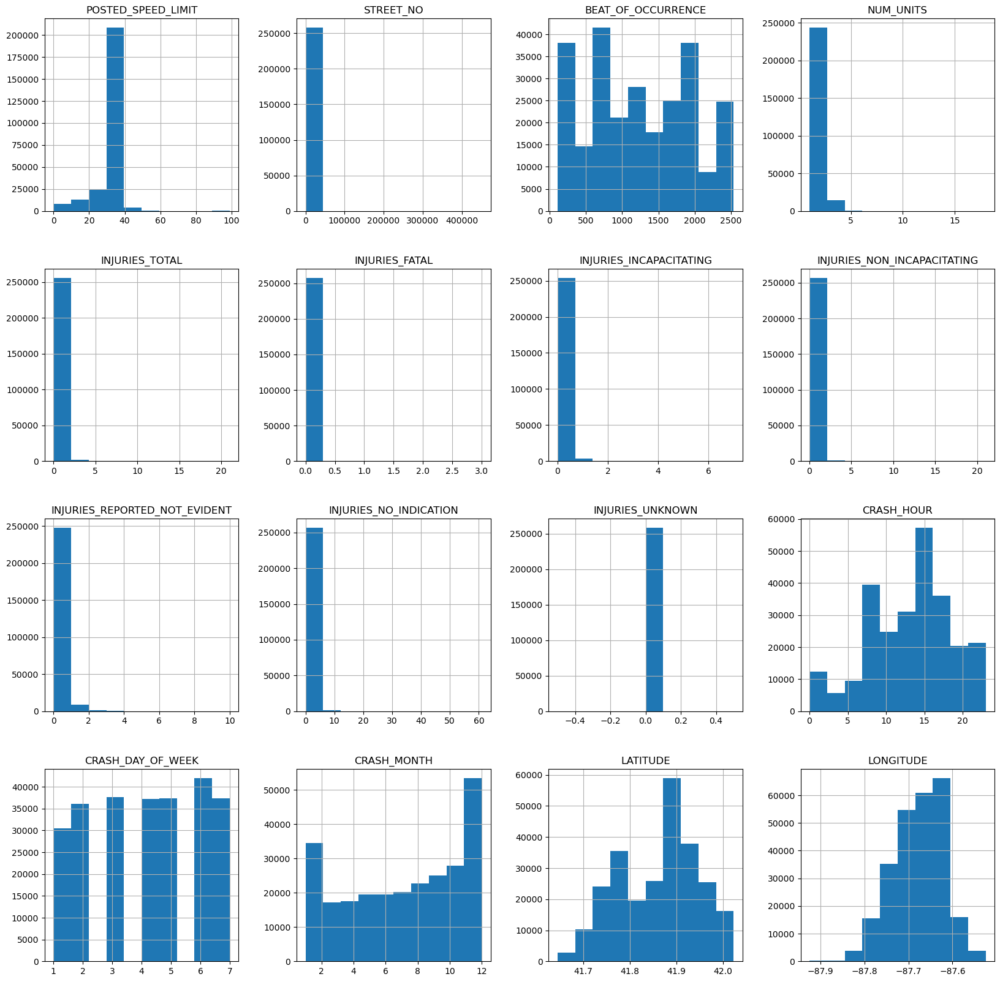

In [26]:
crashes.hist(figsize=(20,20))
plt.show()

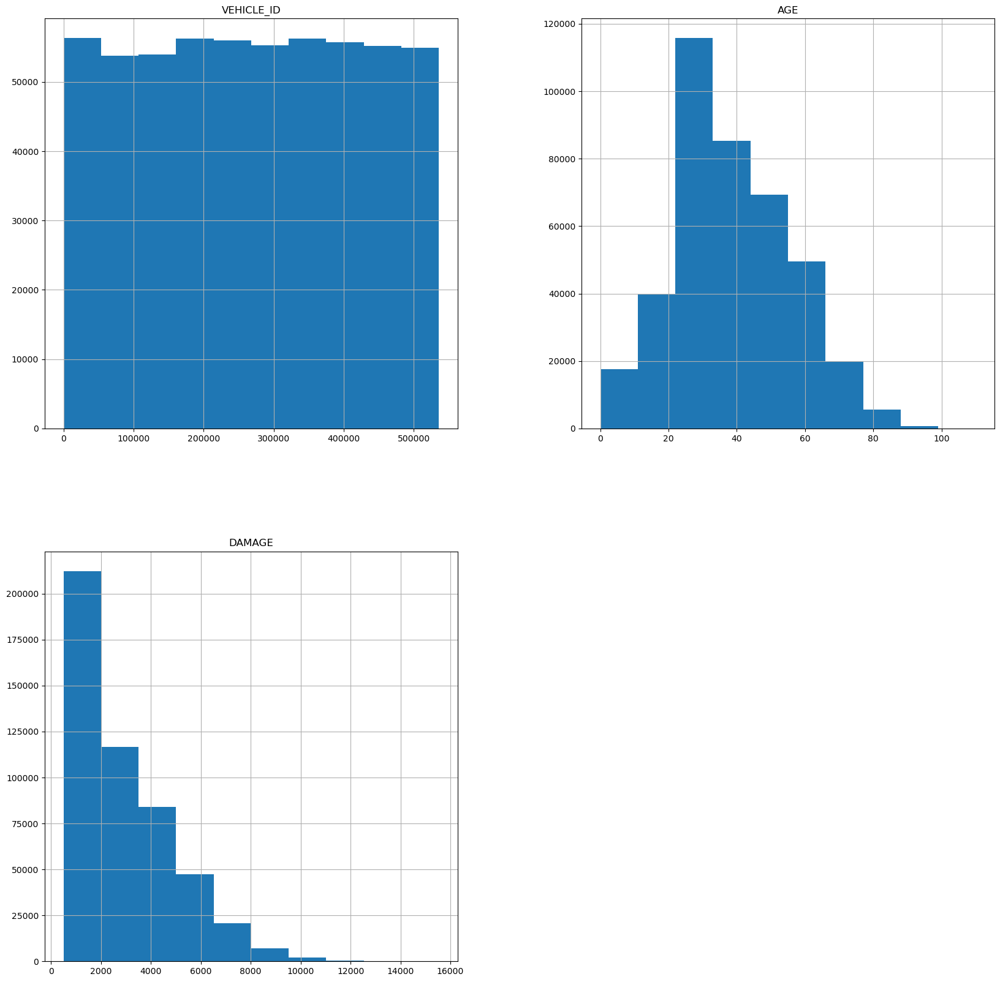

In [27]:
people.hist(figsize=(20,20))
plt.show()

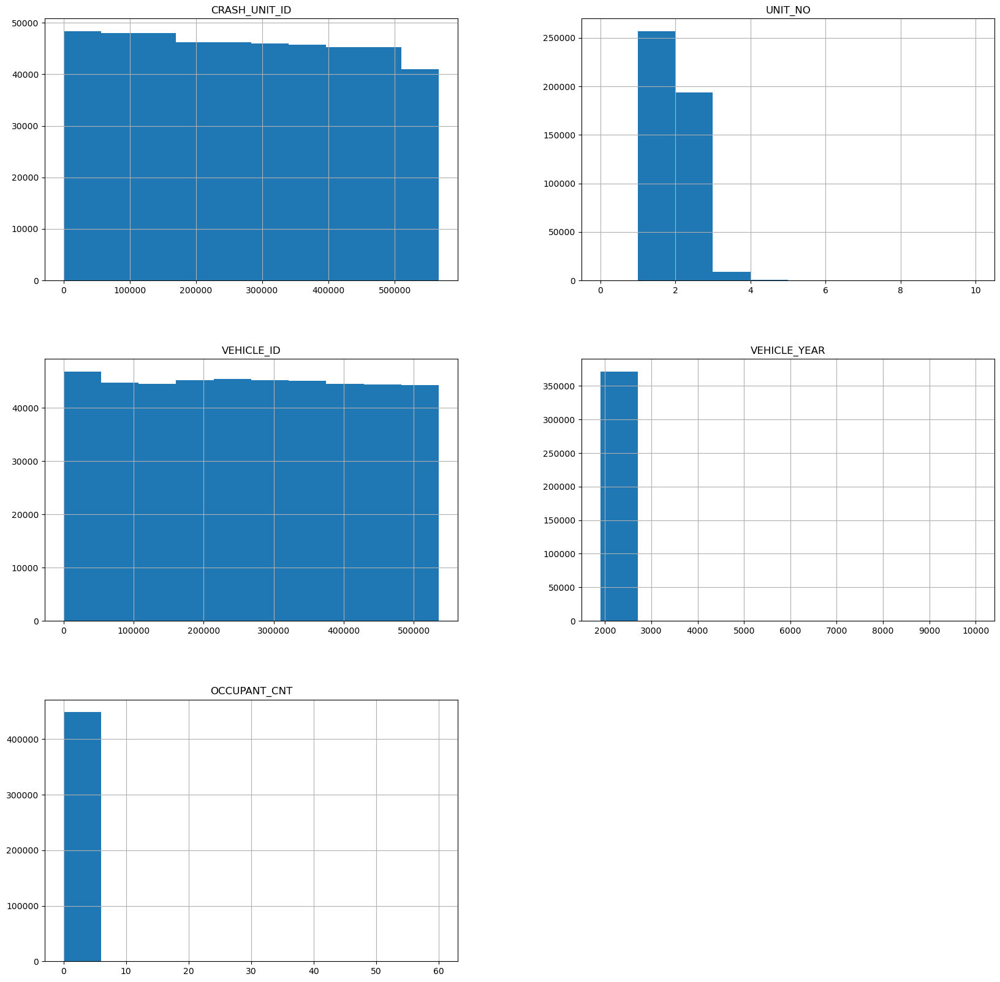

In [28]:
vehicles.hist(figsize=(20,20))
plt.show()

In [29]:
# Check for missing values
missing_values = crashes.isnull().sum()

# Summary statistics to identify outliers
summary_stats = crashes.describe()

# Data types and basic info
data_info = crashes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 257925 entries, 0 to 257924
Data columns (total 36 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   RD_NO                          257925 non-null  object 
 1   CRASH_DATE                     257925 non-null  object 
 2   POSTED_SPEED_LIMIT             257925 non-null  int64  
 3   TRAFFIC_CONTROL_DEVICE         257925 non-null  object 
 4   DEVICE_CONDITION               257925 non-null  object 
 5   WEATHER_CONDITION              257925 non-null  object 
 6   LIGHTING_CONDITION             257925 non-null  object 
 7   FIRST_CRASH_TYPE               257925 non-null  object 
 8   TRAFFICWAY_TYPE                257925 non-null  object 
 9   ALIGNMENT                      257925 non-null  object 
 10  ROADWAY_SURFACE_COND           257925 non-null  object 
 11  ROAD_DEFECT                    257925 non-null  object 
 12  REPORT_TYPE                   

In [20]:
# Check for missing values in each column
missing_values = crashes.isnull().sum()
print(missing_values)

RD_NO                               0
CRASH_DATE                          0
POSTED_SPEED_LIMIT                  0
TRAFFIC_CONTROL_DEVICE              0
DEVICE_CONDITION                    0
WEATHER_CONDITION                   0
LIGHTING_CONDITION                  0
FIRST_CRASH_TYPE                    0
TRAFFICWAY_TYPE                     0
ALIGNMENT                           0
ROADWAY_SURFACE_COND                0
ROAD_DEFECT                         0
REPORT_TYPE                      4996
CRASH_TYPE                          0
DATE_POLICE_NOTIFIED                0
PRIM_CONTRIBUTORY_CAUSE             0
SEC_CONTRIBUTORY_CAUSE              0
STREET_NO                           0
STREET_DIRECTION                    2
STREET_NAME                         1
BEAT_OF_OCCURRENCE                  4
NUM_UNITS                           0
MOST_SEVERE_INJURY                  7
INJURIES_TOTAL                      0
INJURIES_FATAL                      0
INJURIES_INCAPACITATING             0
INJURIES_NON

In [32]:
# Check for missing values
missing_values = people.isnull().sum()

# Summary statistics to identify outliers
summary_stats = people.describe()

# Data types and basic info
data_info = people.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 564565 entries, 0 to 564564
Data columns (total 19 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   PERSON_ID              564565 non-null  object 
 1   PERSON_TYPE            564565 non-null  object 
 2   RD_NO                  564565 non-null  object 
 3   VEHICLE_ID             553869 non-null  float64
 4   CRASH_DATE             564565 non-null  object 
 5   CITY                   420645 non-null  object 
 6   STATE                  422589 non-null  object 
 7   SEX                    557411 non-null  object 
 8   AGE                    403584 non-null  float64
 9   SAFETY_EQUIPMENT       563155 non-null  object 
 10  AIRBAG_DEPLOYED        554113 non-null  object 
 11  EJECTION               557860 non-null  object 
 12  INJURY_CLASSIFICATION  564269 non-null  object 
 13  DRIVER_ACTION          454799 non-null  object 
 14  DRIVER_VISION          454681 non-nu

In [33]:
# Check for missing values in each column
missing_values = people.isnull().sum()
print(missing_values)

PERSON_ID                     0
PERSON_TYPE                   0
RD_NO                         0
VEHICLE_ID                10696
CRASH_DATE                    0
CITY                     143920
STATE                    141976
SEX                        7154
AGE                      160981
SAFETY_EQUIPMENT           1410
AIRBAG_DEPLOYED           10452
EJECTION                   6705
INJURY_CLASSIFICATION       296
DRIVER_ACTION            109766
DRIVER_VISION            109884
PHYSICAL_CONDITION       109501
BAC_RESULT               108833
DAMAGE_CATEGORY               0
DAMAGE                    74309
dtype: int64


In [34]:
# Check for missing values
missing_values = vehicles.isnull().sum()

# Summary statistics to identify outliers
summary_stats = vehicles.describe()

# Data types and basic info
data_info = vehicles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 460437 entries, 0 to 460436
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   CRASH_UNIT_ID        460437 non-null  int64  
 1   RD_NO                460437 non-null  object 
 2   CRASH_DATE           460437 non-null  object 
 3   UNIT_NO              460437 non-null  int64  
 4   UNIT_TYPE            460436 non-null  object 
 5   VEHICLE_ID           450064 non-null  float64
 6   MAKE                 450064 non-null  object 
 7   MODEL                448651 non-null  object 
 8   LIC_PLATE_STATE      410808 non-null  object 
 9   VEHICLE_YEAR         371782 non-null  float64
 10  VEHICLE_DEFECT       450064 non-null  object 
 11  VEHICLE_TYPE         450064 non-null  object 
 12  VEHICLE_USE          450064 non-null  object 
 13  TRAVEL_DIRECTION     450064 non-null  object 
 14  MANEUVER             450064 non-null  object 
 15  OCCUPANT_CNT     

In [35]:
# Check for missing values in each column
missing_values = vehicles.isnull().sum()
print(missing_values)

CRASH_UNIT_ID              0
RD_NO                      0
CRASH_DATE                 0
UNIT_NO                    0
UNIT_TYPE                  1
VEHICLE_ID             10373
MAKE                   10373
MODEL                  11786
LIC_PLATE_STATE        49629
VEHICLE_YEAR           88655
VEHICLE_DEFECT         10373
VEHICLE_TYPE           10373
VEHICLE_USE            10373
TRAVEL_DIRECTION       10373
MANEUVER               10373
OCCUPANT_CNT           10373
FIRST_CONTACT_POINT    10388
dtype: int64


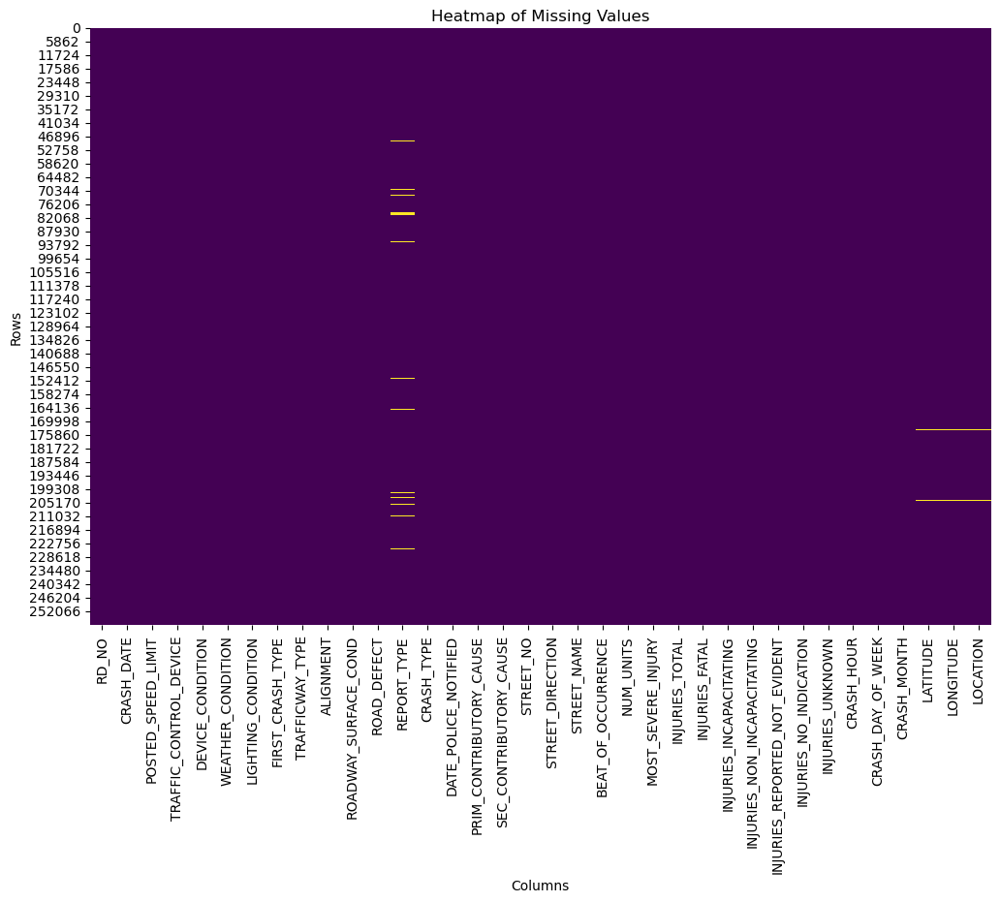

In [36]:
import seaborn as sns

# Assuming `train` is your DataFrame
missing_values = crashes.isnull()

# Set the size of the plot
plt.figure(figsize=(12, 8))

# Generate the heatmap
sns.heatmap(missing_values, cbar=False, cmap='viridis')

# Set title and labels
plt.title('Heatmap of Missing Values')
plt.xlabel('Columns')
plt.ylabel('Rows')

plt.show()

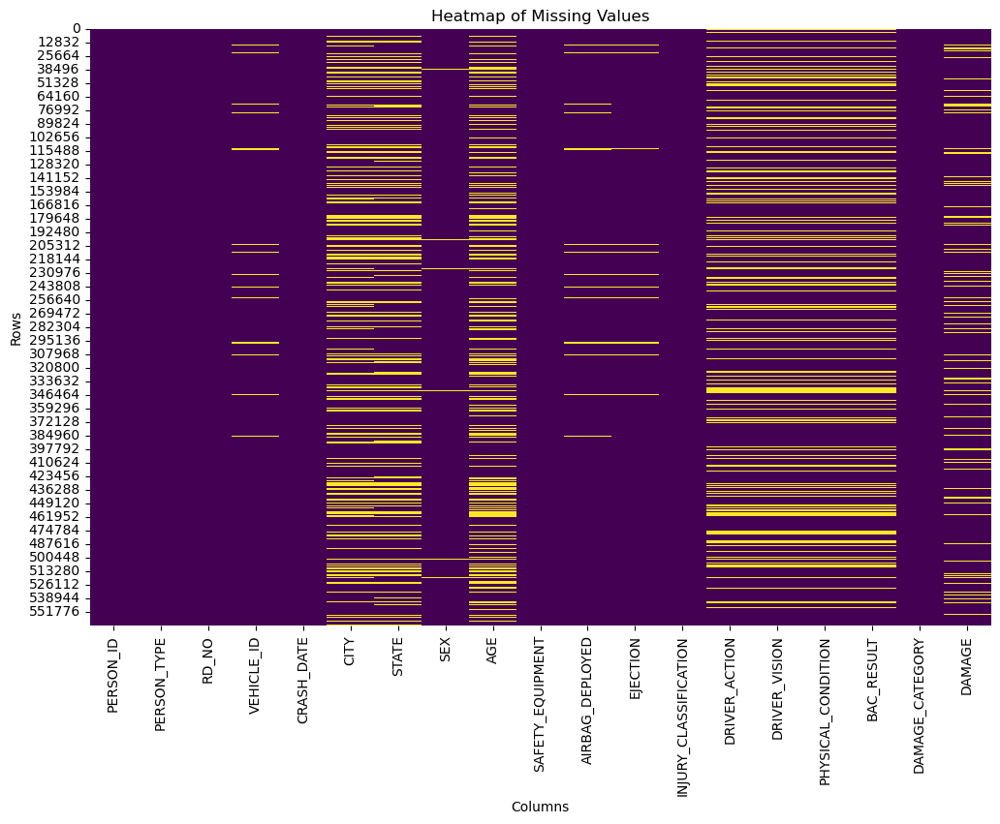

In [37]:
import seaborn as sns

# Assuming `train` is your DataFrame
missing_values = people.isnull()

# Set the size of the plot
plt.figure(figsize=(12, 8))

# Generate the heatmap
sns.heatmap(missing_values, cbar=False, cmap='viridis')

# Set title and labels
plt.title('Heatmap of Missing Values')
plt.xlabel('Columns')
plt.ylabel('Rows')

plt.show()

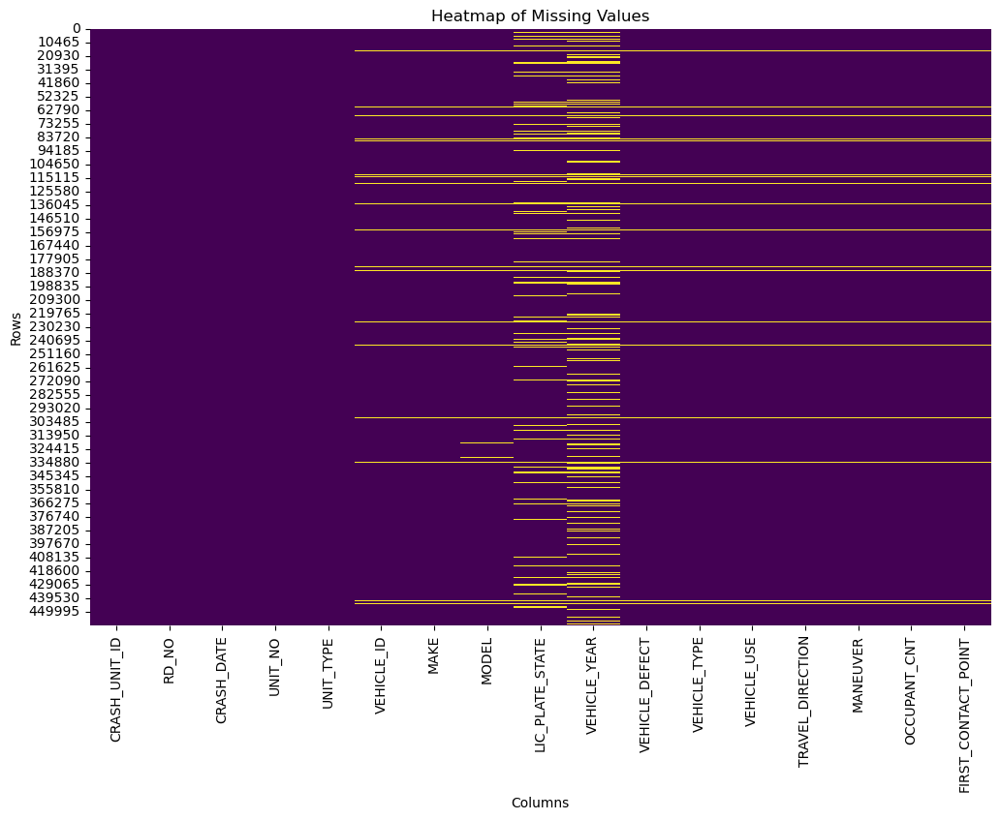

In [38]:
import seaborn as sns

# Assuming `train` is your DataFrame
missing_values = vehicles.isnull()

# Set the size of the plot
plt.figure(figsize=(12, 8))

# Generate the heatmap
sns.heatmap(missing_values, cbar=False, cmap='viridis')

# Set title and labels
plt.title('Heatmap of Missing Values')
plt.xlabel('Columns')
plt.ylabel('Rows')

plt.show()